In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings('ignore')

In [81]:
# Creating the dataframe for the 2023 dataset

datapath = "./../cleaned_dataset_2023.csv"
df = pd.read_csv(datapath)
df.head()

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,16-01-2023,Monday,SpiceJet,SG-8169,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5335
1,16-01-2023,Monday,Indigo,6E-2519,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.3333,1,5899
2,16-01-2023,Monday,GO FIRST,G8-354,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.1667,1,5801
3,16-01-2023,Monday,SpiceJet,SG-8709,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5794
4,16-01-2023,Monday,Air India,AI-805,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.1667,1,5955


### **Information regarding the Dataset**

We will now look at the information regarding the dataset that we are using.

In [82]:
# Preprocessing.... Checking for NULL values

print(df.isnull().sum())

Date_of_journey      0
Journey_day          0
Airline              0
Flight_code          0
Class                0
Source               0
Departure            0
Total_stops          0
Arrival              0
Destination          0
Duration_in_hours    0
Days_left            0
Fare                 0
dtype: int64


In [83]:
print("\nInformation regarding dataset : \n")
df.info()


Information regarding dataset : 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date_of_journey    452088 non-null  object 
 1   Journey_day        452088 non-null  object 
 2   Airline            452088 non-null  object 
 3   Flight_code        452088 non-null  object 
 4   Class              452088 non-null  object 
 5   Source             452088 non-null  object 
 6   Departure          452088 non-null  object 
 7   Total_stops        452088 non-null  object 
 8   Arrival            452088 non-null  object 
 9   Destination        452088 non-null  object 
 10  Duration_in_hours  452088 non-null  float64
 11  Days_left          452088 non-null  int64  
 12  Fare               452088 non-null  int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 44.8+ MB


In [84]:
# Statistical Description of Data
df.describe()

,Duration_in_hours,Days_left,Fare
count,452088.000000,452088.000000,452088.000000
mean,12.349222,25.627902,22840.100890
std,7.431478,14.300846,20307.963002
min,0.750000,1.000000,1307.000000
25%,6.583300,13.000000,8762.750000
50%,11.333300,26.000000,13407.000000
75%,16.500000,38.000000,35587.000000
max,43.583300,50.000000,143019.000000


In [85]:
df.corr().T

,Duration_in_hours,Days_left,Fare
Duration_in_hours,1.000000,-0.032878,0.179909
Days_left,-0.032878,1.000000,-0.087852
Fare,0.179909,-0.087852,1.000000


In [86]:
print("Size of Data used : ", df.shape)

Size of Data used :  (452088, 13)


In [87]:
print("Dropping duplicate values and displaying the size : ")
df = df.dropna()
df.drop_duplicates( keep=False, inplace=True)
df = df.reset_index(drop = True)
df.shape

Dropping duplicate values and displaying the size : 


(440087, 13)

## **Exploring and Visualizing the Dataset**

The insights that we gain through the process
- The most popular airline is Indigo
- The most common class is "Economy"

In [88]:
df1 = df.groupby(['Airline','Flight_code'],as_index=False).count()
df1.Airline.value_counts()

Indigo         702
Air India      171
Vistara        165
AirAsia        106
GO FIRST       104
SpiceJet        92
AkasaAir        51
AllianceAir     10
StarAir          4
Name: Airline, dtype: int64

In [89]:
df2 = df.groupby(['Flight_code','Airline','Class'],as_index=False).count()
df2['Class'].value_counts()

Economy            1401
Business            295
Premium Economy     137
First                 3
Name: Class, dtype: int64

- **From the graph below we can see that the most common class in Economy**

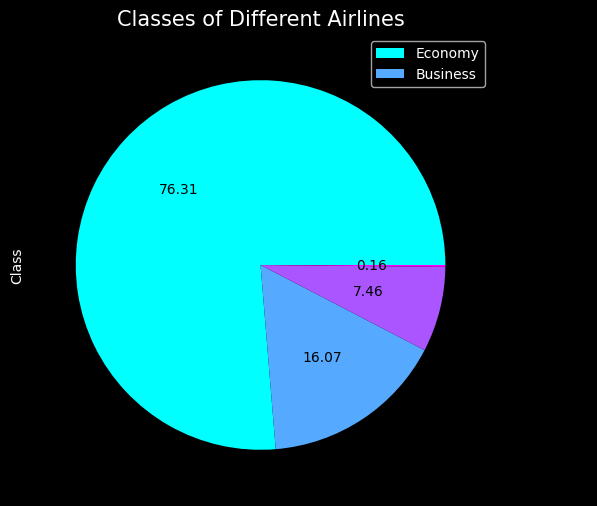

In [90]:
plt.figure(figsize=(8,6))
df2['Class'].value_counts().plot(kind='pie',textprops={'color':'black'},autopct='%.2f',cmap='cool')
plt.title('Classes of Different Airlines',fontsize=15)
plt.legend(['Economy','Business'])
plt.show()

### **Prices and Airline relations**

- The maximum price range is provided by Vistara
- The most expensive fight would be Vistara and Air India
- The airlines that provide similar prices are SpiceJet, AirAsia, GoFirst and Indigo

In [91]:
fig = px.box(df, y = "Fare", x = 'Airline', color_discrete_sequence = ["orange"], template = 'seaborn')
fig.show()

### **Classes and their prices**

- Business class and First class tickets have the highest price range

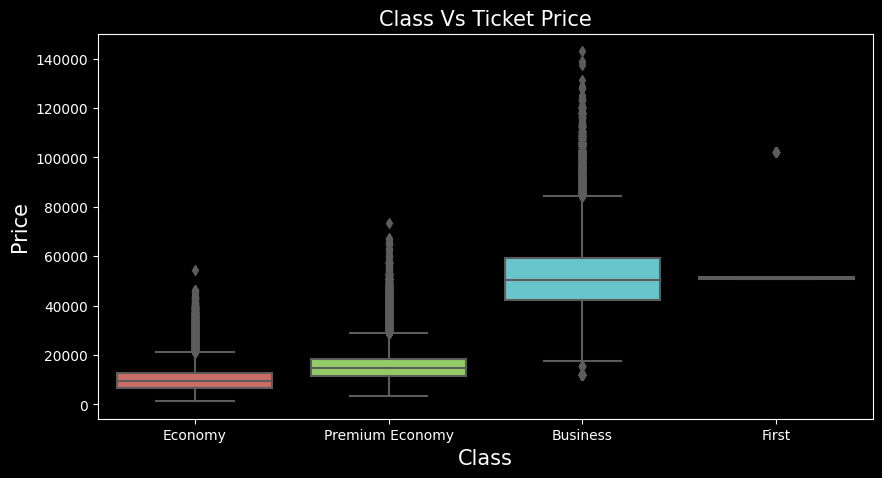

In [92]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Class',y='Fare',data=df,palette='hls')
plt.title('Class Vs Ticket Price',fontsize=15)
plt.xlabel('Class',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

### **The relation between number of stops and the price**

- The flight that have a single stop have their prices largely distributed

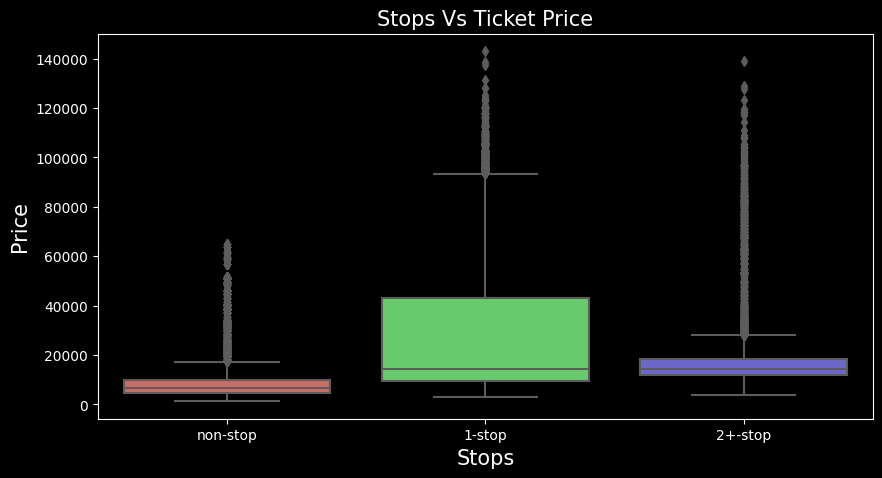

In [93]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Total_stops',y='Fare',data=df,palette='hls')
plt.title('Stops Vs Ticket Price',fontsize=15)
plt.xlabel('Stops',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

## **The relation between price, departure and arrival times**

Departure time vs Ticket price
- Price is high at night time
- Price is almost equal during early morning, morning and evening
- Price is low for late night flights

Arrival time vs Ticket price
- Price is high in evening
- Price is almost equal during morning and night
- Price is low for lat night flights

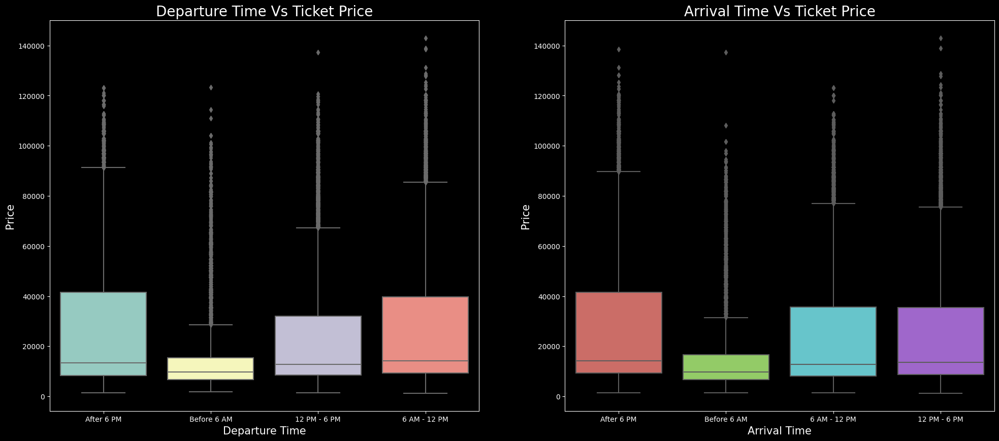

In [94]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Departure',y='Fare',data=df)
plt.title('Departure Time Vs Ticket Price',fontsize=20)
plt.xlabel('Departure Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Arrival',y='Fare',data=df,palette='hls')
plt.title('Arrival Time Vs Ticket Price',fontsize=20)
plt.xlabel('Arrival Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

## **The relation between price, source and destination**

Source vs Ticket price
- Price is high from Kolkata
- Price is almost equal in Mumbai, Chennai, Hydrabad and Bangalore
- Price is low for flights from Delhi

Destination vs Ticket price
- Price is high for Kolkata and Chennai
- Price is almost equal for Mumbai and Bangalore
- Price is low for Delhi

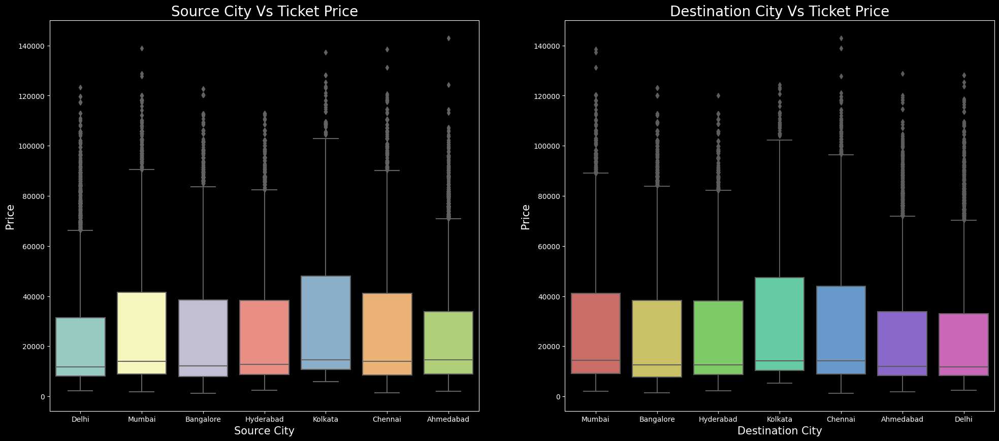

In [95]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Source',y='Fare',data=df)
plt.title('Source City Vs Ticket Price',fontsize=20)
plt.xlabel('Source City',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Destination',y='Fare',data=df,palette='hls')
plt.title('Destination City Vs Ticket Price',fontsize=20)
plt.xlabel('Destination City',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

### **How the price varies with respect to time for different classes**

- In economy and business class thr price increases with time

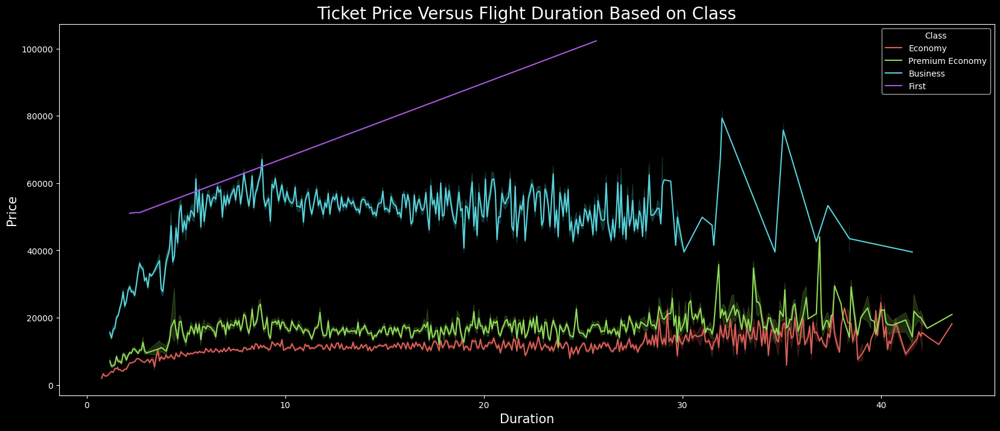

In [96]:
plt.style.use('dark_background')
plt.figure(figsize=(20,8))
sns.lineplot(data = df,x = 'Duration_in_hours',y = 'Fare',hue = 'Class',palette = 'hls')
plt.title('Ticket Price Versus Flight Duration Based on Class',fontsize = 20)
plt.xlabel('Duration',fontsize = 15)
plt.ylabel('Price',fontsize = 15)
plt.show()

**How does the price affect the days of departure ?**

- the ticket prices are highest when there are two days left for departure

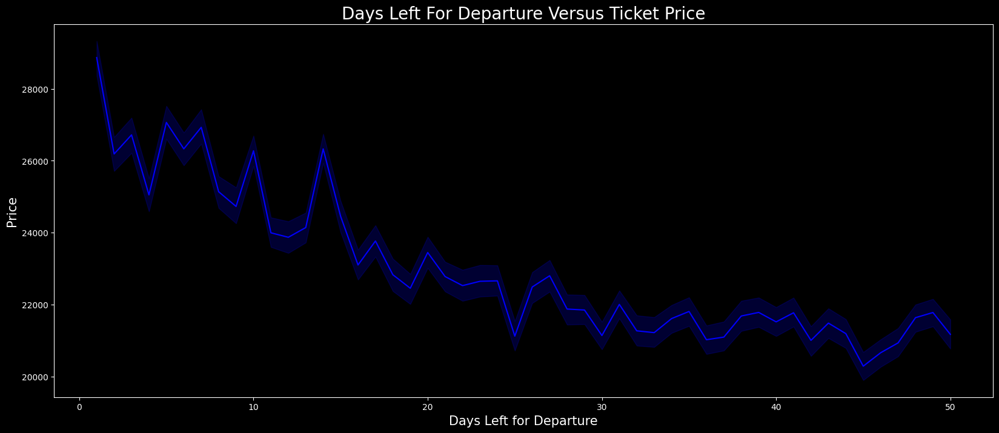

In [97]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df,x='Days_left',y='Fare',color='blue')
plt.title('Days Left For Departure Versus Ticket Price',fontsize=20)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

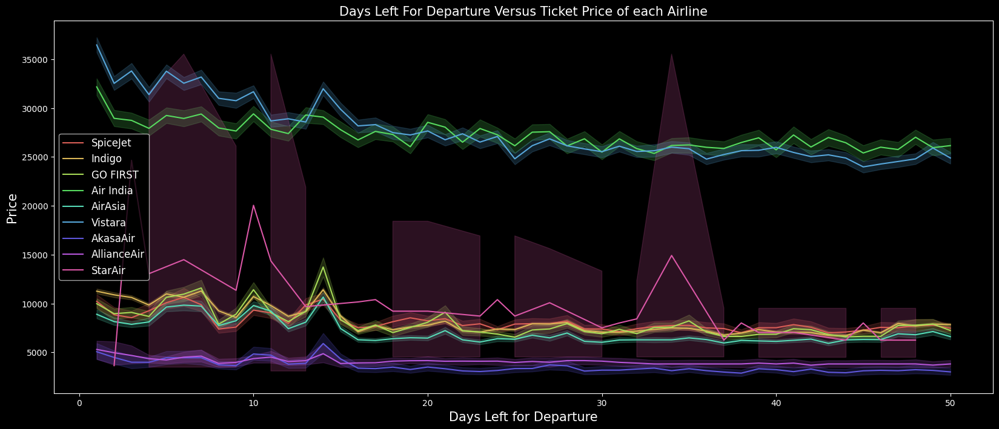

In [98]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df,x='Days_left',y='Fare',color='blue',hue='Airline',palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline',fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

**Total number of Flights from one city to another**

In [99]:
df.groupby(['Flight_code','Source','Destination','Airline','Class'],as_index=False).count().groupby(['Source','Destination'],as_index=False)['Flight_code'].count().head(10)

,Source,Destination,Flight_code
0,Ahmedabad,Bangalore,85
1,Ahmedabad,Chennai,82
2,Ahmedabad,Delhi,64
3,Ahmedabad,Hyderabad,77
4,Ahmedabad,Kolkata,88
5,Ahmedabad,Mumbai,50
6,Bangalore,Ahmedabad,136
7,Bangalore,Chennai,97
8,Bangalore,Delhi,181
9,Bangalore,Hyderabad,119


**Average Price of different Airlines from Source city to Destination city**

In [100]:
df.groupby(['Airline','Source','Destination'],as_index=False)['Fare'].mean().head(10)

,Airline,Source,Destination,Fare
0,Air India,Ahmedabad,Bangalore,30898.056017
1,Air India,Ahmedabad,Chennai,31986.554209
2,Air India,Ahmedabad,Delhi,25284.740260
3,Air India,Ahmedabad,Hyderabad,28618.727551
4,Air India,Ahmedabad,Kolkata,30114.170294
5,Air India,Ahmedabad,Mumbai,31228.560304
6,Air India,Bangalore,Ahmedabad,28063.483264
7,Air India,Bangalore,Chennai,28978.088460
8,Air India,Bangalore,Delhi,23134.751645
9,Air India,Bangalore,Hyderabad,27742.954733


# **Creating Models**

In [101]:
# storing the Dependent Variables in X and Independent Variable in Y
x=df.drop(['Fare'],axis=1)
y=df['Fare']

In [102]:
df3 = df
df3.head()

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,16-01-2023,Monday,SpiceJet,SG-8169,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5335
1,16-01-2023,Monday,Indigo,6E-2519,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.3333,1,5899
2,16-01-2023,Monday,GO FIRST,G8-354,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.1667,1,5801
3,16-01-2023,Monday,SpiceJet,SG-8709,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5794
4,16-01-2023,Monday,Air India,AI-805,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.1667,1,5955


In [103]:
df3["Journey_month"] = pd.to_datetime(df3["Date_of_journey"], format = "%d-%m-%Y").dt.month

In [104]:
# Encoding the training dataset
Airline = df3[["Airline"]]
Airline = pd.get_dummies(Airline, drop_first= True)
Source = df3[["Source"]]
Source = pd.get_dummies(Source, drop_first= True)
df3["Destination"].value_counts()
Destination = df3[["Destination"]]
Destination = pd.get_dummies(Destination, drop_first = True)
df3.drop(["Flight_code"], axis = 1, inplace = True)
df3.replace({"non-stop": 0, "1 stop": 1, "2+ stops": 2}, inplace = True)
df4 = pd.concat([df3, Airline, Source, Destination], axis = 1)
df4.drop(["Airline", "Source", "Destination", "Date_of_journey"], axis = 1, inplace = True)
print(df4.head())

  Journey_day    Class   Departure Total_stops      Arrival  \
0      Monday  Economy  After 6 PM           0   After 6 PM   
1      Monday  Economy  After 6 PM           0  Before 6 AM   
2      Monday  Economy  After 6 PM           0  Before 6 AM   
3      Monday  Economy  After 6 PM           0   After 6 PM   
4      Monday  Economy  After 6 PM           0   After 6 PM   

   Duration_in_hours  Days_left  Fare  Journey_month  Airline_AirAsia  ...  \
0             2.0833          1  5335              1                0  ...   
1             2.3333          1  5899              1                0  ...   
2             2.1667          1  5801              1                0  ...   
3             2.0833          1  5794              1                0  ...   
4             2.1667          1  5955              1                0  ...   

   Source_Delhi  Source_Hyderabad  Source_Kolkata  Source_Mumbai  \
0             1                 0               0              0   
1             1 

In [105]:
df4.head()

,Journey_day,Class,Departure,Total_stops,Arrival,Duration_in_hours,Days_left,Fare,Journey_month,Airline_AirAsia,...,Source_Delhi,Source_Hyderabad,Source_Kolkata,Source_Mumbai,Destination_Bangalore,Destination_Chennai,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Destination_Mumbai
0,Monday,Economy,After 6 PM,0,After 6 PM,2.0833,1,5335,1,0,...,1,0,0,0,0,0,0,0,0,1
1,Monday,Economy,After 6 PM,0,Before 6 AM,2.3333,1,5899,1,0,...,1,0,0,0,0,0,0,0,0,1
2,Monday,Economy,After 6 PM,0,Before 6 AM,2.1667,1,5801,1,0,...,1,0,0,0,0,0,0,0,0,1
3,Monday,Economy,After 6 PM,0,After 6 PM,2.0833,1,5794,1,0,...,1,0,0,0,0,0,0,0,0,1
4,Monday,Economy,After 6 PM,0,After 6 PM,2.1667,1,5955,1,0,...,1,0,0,0,0,0,0,0,0,1


In [106]:
# Splitting the Data into Training set and Testing Set
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=42)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((308060, 12), (132027, 12), (308060,), (132027,))

In [107]:
# Fitting the model into VotingRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.linear_model import LinearRegression

rf = RandomForestRegressor()
gb = GradientBoostingRegressor()
lr = LinearRegression()

voting_regressor = VotingRegressor([('rf', rf), ('gb', gb), ('lr', lr)])
# Fitting the model
voting_regressor.fit(x_train, y_train)

# Predicting the values
y_pred = voting_regressor.predict(x_test)

# Calculating the mean absolute error
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)
accuracy = voting_regressor.score(X_test, y_test)
print("Accuracy: ", accuracy)

ValueError: could not convert string to float: '01-02-2023'